In [302]:
import os
import scipy.io
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
print('Scipy: ', scipy.__version__)
print('Numpy: ', np.__version__)
print('Pandas: ', pd.__version__)
print('Scanpy: ', sc.__version__)
print('Matplotlib: ', matplotlib.__version__)
print('Seaborn: ', sns.__version__)
!python --version
# settings for image output
sns.set(style="whitegrid")
matplotlib.rcParams["figure.dpi"]=200

Scipy:  1.8.0
Numpy:  1.21.5
Pandas:  1.4.1
Scanpy:  1.8.2
Matplotlib:  3.5.1
Seaborn:  0.11.2
Python 3.9.7


In [243]:
sc.settings.verbosity = 1             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 4), facecolor='white')

__Frozen PBMCs (Donor A), Cell Ranger 1.1.0 dataset available at 10x Genomics__

In [244]:
adata = sc.read_10x_mtx(
        '../data/filtered_matrices_mex/hg19/', 
        var_names='gene_symbols',
        cache=True)

In [245]:
adata.var_names_make_unique() # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [246]:
adata

AnnData object with n_obs × n_vars = 2900 × 32738
    var: 'gene_ids'

In [247]:
sc.pp.filter_cells(adata, min_genes=200) # Minimum number of genes expressed required for a cell to pass filtering.
sc.pp.filter_genes(adata, min_cells=3) # Minimum number of cells expressed required for a gene to pass filtering.

In [248]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [249]:
adata = adata[adata.obs['n_genes_by_counts'] < 5000, :]  # expressed genes per cell < 5000
adata = adata[adata.obs['pct_counts_mt'] < 2.5, :] # Percentage of expressed mitochondria-related genes < 25%

In [250]:
adata

View of AnnData object with n_obs × n_vars = 2271 × 13067
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [251]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4) # Normalization of data to allow comparison of values between cells

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [252]:
sc.pp.log1p(adata)

In [253]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [254]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [255]:
sc.pp.scale(adata, max_value=10)

In [256]:
sc.tl.pca(adata, svd_solver='arpack')

In [257]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [258]:
sc.tl.umap(adata)

In [259]:
sc.tl.louvain(adata)

# https://en.wikipedia.org/wiki/Louvain_method

__GSE149938__

In [260]:
adata_ref = sc.read_csv(
        '../data/GSE149938_RAW/GSE149938_umi_matrix.csv.gz')

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [261]:
adata_ref.var_names_make_unique() # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [262]:
adata_ref

AnnData object with n_obs × n_vars = 7643 × 19813

In [263]:
sc.pp.filter_cells(adata_ref, min_genes=200) # Minimum number of genes expressed required for a cell to pass filtering.
sc.pp.filter_genes(adata_ref, min_cells=3) # Minimum number of cells expressed required for a gene to pass filtering.

In [264]:
adata_ref.var['mt'] = adata_ref.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_ref, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [265]:
adata_ref = adata_ref[adata_ref.obs['n_genes_by_counts'] < 5000, :]  # expressed genes per cell < 5000
adata_ref = adata_ref[adata_ref.obs['pct_counts_mt'] < 25, :] # Percentage of expressed mitochondria-related genes < 25%

In [266]:
adata_ref

View of AnnData object with n_obs × n_vars = 6620 × 18499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [267]:
sc.pp.normalize_per_cell(adata_ref, counts_per_cell_after=1e4) # Normalization of data to allow comparison of values between cells

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [268]:
sc.pp.log1p(adata_ref)

In [269]:
sc.pp.highly_variable_genes(adata_ref, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [270]:
sc.pp.regress_out(adata_ref, ['total_counts', 'pct_counts_mt'])

In [271]:
sc.pp.scale(adata_ref, max_value=10)

In [272]:
sc.tl.pca(adata_ref, svd_solver='arpack')

In [273]:
sc.pp.neighbors(adata_ref, n_neighbors=10, n_pcs=40)

In [274]:
sc.tl.umap(adata_ref)

In [275]:
sc.tl.louvain(adata_ref)

In [276]:
lt=adata_ref.obs.index.values.tolist()
cell_ref=""
for l in lt:
    cell_ref=cell_ref+l.split("_")[0]+","
adata_ref.obs["celltype_origin"]=list(cell_ref.split(",")[1:])

In [278]:
adata.obs["celltype_origin"]="PBMCs"

__Integrating data using ingest and BBKNN__
* Frozen PBMCs [Cell Ranger 1.1.0 dataset available at 10x Genomics]: adata
* GSE149938: adata_ref

In [299]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [279]:
adata_ref.var_names.difference(adata.var_names)

Index(['A1CF', 'A2M', 'A2ML1', 'A4GALT', 'A4GNT', 'AADAC', 'AADACL2',
       'AADACL3', 'AADACL4', 'AADAT',
       ...
       'ZSCAN10', 'ZSCAN23', 'ZSCAN26', 'ZSCAN4', 'ZSCAN5B', 'ZSCAN5CP',
       'ZSWIM2', 'ZSWIM4', 'ZSWIM5', 'ZYG11A'],
      dtype='object', length=7111)

In [280]:
adata.var_names.difference(adata_ref.var_names)

Index(['7SK-2', 'A1BG-AS1', 'A2M-AS1', 'AC002116.7', 'AC002117.1',
       'AC002310.12', 'AC002451.3', 'AC002467.7', 'AC003075.4', 'AC004069.2',
       ...
       'ZNF259', 'ZNF337-AS1', 'ZNF582-AS1', 'ZNF667-AS1', 'ZNF674-AS1',
       'ZNF883', 'ZNRD1-AS1', 'ZSCAN16-AS1', 'hsa-mir-1199', 'hsa-mir-8072'],
      dtype='object', length=1679)

In [281]:
var_names = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:, var_names]
adata = adata[:, var_names]

In [282]:
adata

View of AnnData object with n_obs × n_vars = 2271 × 11388
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'louvain', 'celltype_origin'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'louvain'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


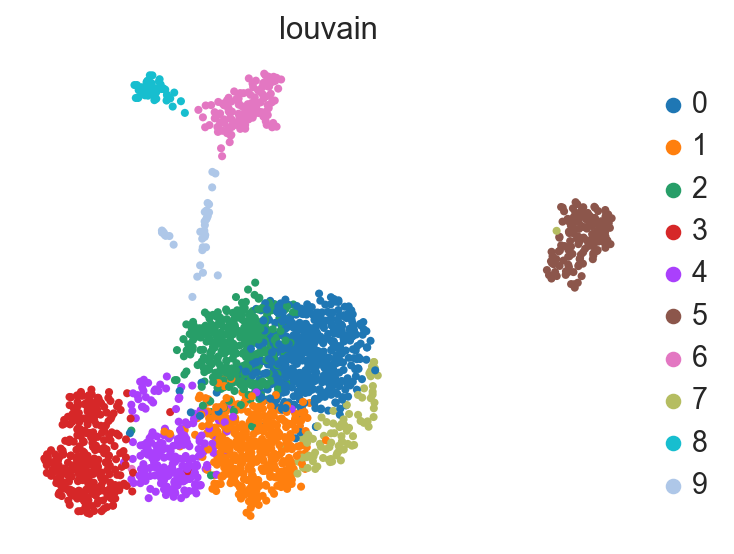

In [283]:
sc.pl.umap(adata, color=['louvain'])

In [284]:
adata_ref

View of AnnData object with n_obs × n_vars = 6620 × 11388
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'louvain', 'celltype_origin'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'louvain'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


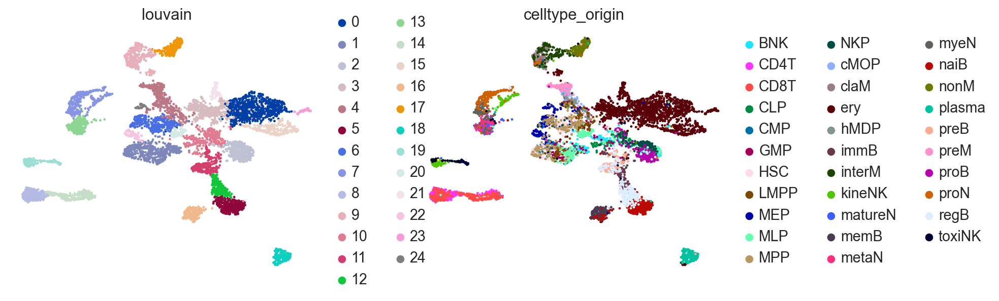

In [285]:
sc.pl.umap(adata_ref, color=['louvain', 'celltype_origin'])

In [286]:
adata_concat = adata_ref.concatenate(adata, batch_categories=['GSE149938', 'PBMCs'])

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [287]:
adata_concat.obs.louvain = adata_concat.obs.louvain.astype('category')
adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering
adata_concat.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix category colors

/var/folders/__/2wjnr_6x28xf_g_zpqybl3rr0000gn/T/ipykernel_8931/2341824880.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering


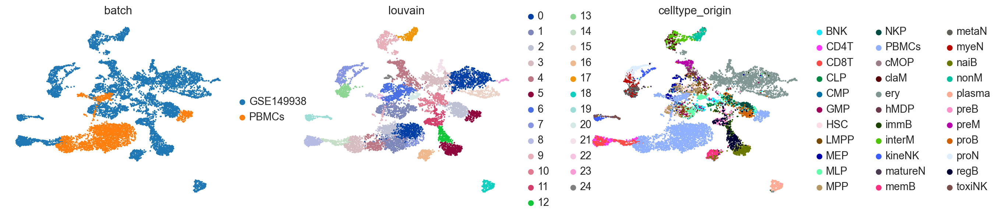

In [288]:
sc.pl.umap(adata_concat, color=['batch', 'louvain', 'celltype_origin'])

In [289]:
sc.external.pp.bbknn(adata_concat, batch_key='batch')  # running bbknn 1.3.6

In [290]:
sc.tl.umap(adata_concat)

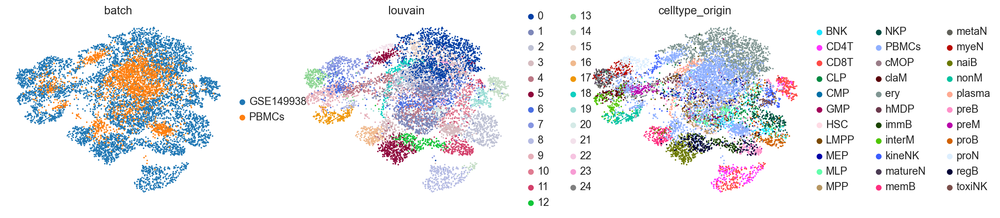

In [291]:
sc.pl.umap(adata_concat, color=['batch', 'louvain', 'celltype_origin'])

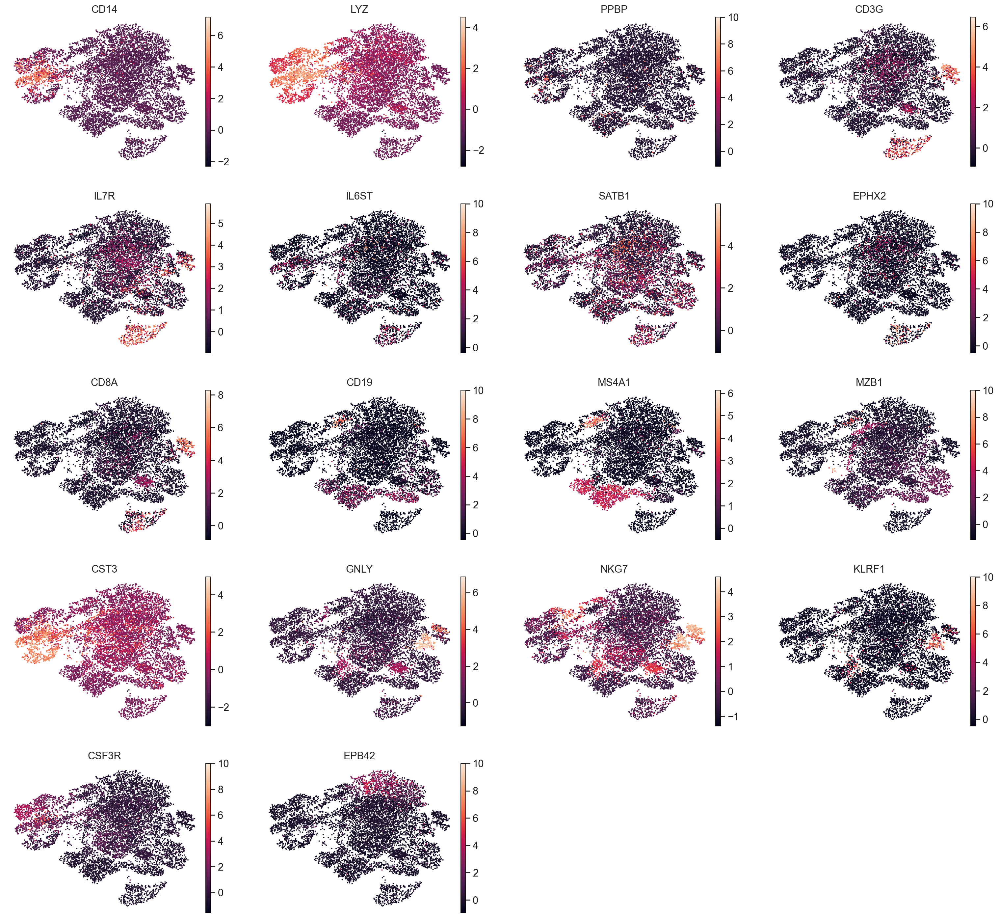

In [292]:
sc.pl.umap(adata_concat, color=[
    'CD14', 'LYZ',  # monocyte
    "PPBP", # megakaryocyte
    'CD3G', 'IL7R', # T cell
    'IL6ST','SATB1', 'EPHX2', # NaiveCD4
    'CD8A', # cytotoxic T
    'CD19','MS4A1', #  B
    'MZB1', # plasma
    'CST3', # Dendritic Cells
    'GNLY', 'NKG7', 'KLRF1', # NK
    'CSF3R', # Neutrophil
    'EPB42', # Erythrocyte
    # Cell: April 29, 2021, doi:10.1016/j.cell.2021.03.056.
    ## "IL6ST","SATB1","CRLF3","TRABD2A", # Naive CD4
    ## "CYB561","EDARADD", "CLIC5", # Th1
    ## "GALT","GATA3","ALS2CL","CD200R1", # Th2
    ## "CCR6","USP10","CISH","RORC","MAP3K4", # Th17
    ## "LIMS1","FAAH2", "CDK5R1","FBXL8", # Tfh
    ## "RASA2","RTKN2","ZNF101","GPA33", # Fra1 nTreg
    ## "ARHGDIB", "GBP5", "IL32","ARL6IP1", "IL2RA", # Fra2 eTreg
    ## "CCR7","CD8B","ABLIM1","LDLRAP1", "NELL2" , # Naive CD8
    ## "DKK3","ITGA1","C16orf45", #CM CD8
    ## "GZMK","PARP8","KLRG1","CXCR6","SLC4A10", # EM CD8
    ## "CCL5","CD8A","GZMH","FCRL6","EOMES", # TEMRA CD8
    ## "GNLY","PRF1","CX3CR1","IL2RB","JAK1", # NK
    ## "TCL1A","CD79B","IL4R", # Naive B
    ## "FCRLA","FCRL2","RALGPS2","QRSL1","MBD4", # USM B 
    ## "BANK1","TLR10","OSBPL10", "AIM2","KCNN4", # SM B
    ## "HSP90B1", "HSPA5", "XBP1", # plasmablast
    ## "EZR","FCRL3", "BLK","FCRL5","SCIMP", # DNB
    ## "LYZ","FCN1","MPEG1","VCAN", "GRN", # CL Mono
    ## "PSAP","FTL","IFI30","COTL1","RHOA",  # Int Mono
    ## "FCGR3A","TNFRSF1B","SERPINA1","WARS","CSF1R", # NC Mono
    ## "IRF8","GZMB","PLD4","CD164","CTSB", # pDC
    ## "ACTB","HLA-DRA","HLA-DRB1","HLA-DPA1","HLA-DPB1", # mDC
    ## "B2M","RGS2","S100A9","SOD2", # Neutrophil
])

In [293]:
# logistic regression
sc.tl.rank_genes_groups(adata_concat, 'louvain', method='logreg')

/Users/inamojun/opt/anaconda3/envs/test_env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [300]:
pd.DataFrame(adata_concat.uns['rank_genes_groups']['names']).head(10)

# pd.DataFrame(adata_concat.uns['rank_genes_groups']['names']).to_csv("~/test.csv")

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,RPL21,AQP3,ID3,GZMH,GZMK,FCER2,CYTL1,S100P,MAL,CLEC10A,BAALC,TCL1A,MYO1C,CXCR2,GZMA,BNIP3L,CLECL1,FCGR3A,DERL3,GNLY,HOXA9,RETN,SERPINE2,KRT81,GATA2
1,GYPC,TRADD,FHIT,FCGR3A,DUSP2,CD79A,ITGA2B,BPI,C1QA,FCER1A,LAT2,ACSM3,HRK,CXCR1,CCL5,BPGM,AIM2,CDKN1C,FKBP11,KLRF1,ACY3,RNASE2,GATA2,KRT86,SLC45A3
2,RGCC,S100A11,CD9,FGFBP2,LYAR,MS4A1,NFE2,RGL4,IL7R,ENHO,PAG1,NSMCE1,FCRL5,KCNJ15,GZMK,DCAF12,GPR183,PAPSS2,TXNDC5,KLRC2,HOPX,LRG1,PRKACB,PLEK2,ANGPT2
3,SP4,CCR10,MLXIP,GZMB,CCL5,HVCN1,S100A8,TSPAN17,TCF7,CD1C,STMN1,PCDH9,TTN,FCGR2A,CD3G,MKRN1,CRIP1,VMO1,SLAMF7,KLRD1,TSC22D1,ATP8B4,GUCY1B3,HSPA2,CSF2RB
4,NME4,ANXA1,SMAD1,GNLY,GZMA,IL4R,ALDH1A1,EMB,CCR7,CYP1B1,RASD1,IGLL5,NEIL1,TREM1,CD8B,SNCA,TNFRSF13B,CDH23,SPAG4,GZMB,SPINK2,CST7,ITGA2B,SLC14A1,FCER1A
5,CCR7,FTH1,LEF1,PRF1,NKG7,TCL1A,CD14,PADI4,TRABD2A,CPVL,H2AFY,LAMP5,PMEPA1,CLEC7A,CD8A,SLC25A39,ARHGAP24,CX3CR1,SEC11C,TXK,LZTFL1,UGCG,CCNG1,EFHD1,IL5RA
6,RGS10,GAPDH,HPS4,HOPX,HCST,CD79B,S100A9,CKAP4,LEF1,LGALS2,SPRY1,BACH2,PPP1R14A,ZFP36L1,KLRG1,LGALS3,SCIMP,TNFRSF8,TNFRSF17,CD247,CD34,S100P,MT2A,XPO7,BACE2
7,FBXO5,LTB,GNG11,NKG7,MAP3K8,HLA-DRA,CSF3R,FAM101B,CAMK4,TGFBI,ZCCHC7,CDHR3,PLD4,FFAR2,CD3D,BCL2L1,BANK1,RHOC,PRDX4,SPON2,SPNS3,DTWD2,RNF130,MAN1A1,LMO4
8,MDS2,BEX1,FBLN7,CCL4,KLRG1,HLA-DPA1,MGST1,RNASE3,MS4A7,ALDH2,ADA,IRF4,MYO7B,G0S2,CXCR3,TRAK2,CTSH,TPPP3,SELM,IFITM1,LGMN,CEBPE,PDLIM1,ZNF768,GALC
9,UBE2T,IL32,GSTM3,CST7,CTSW,VPREB3,CLU,GJB6,CDKN1C,CD1D,IER3,AFF3,TUBB6,FAM129A,IL32,FAM46C,ZBTB32,HMOX1,SSR4,NCAM1,OSBPL3,GPI,DHRS3,SLC16A1,EREG


In [295]:
marker_genes = [    
    'CD14', 'LYZ',  # monocyte
    "PPBP", # megakaryocyte
    'CD3G', 'IL7R', # T cell
    'IL6ST','SATB1', 'EPHX2', # NaiveCD4
    'CD8A', # cytotoxic T
    'CD19','MS4A1', #  B
    'MZB1', # plasma
    'CST3', # Dendritic Cells
    'GNLY', 'NKG7', 'KLRF1', # NK
    'CSF3R', # Neutrophil
    'EPB42', # Erythrocyte
    # Cell: April 29, 2021, doi:10.1016/j.cell.2021.03.056.
    "IL6ST","SATB1","CRLF3","TRABD2A", # Naive CD4
    "CYB561","EDARADD", "CLIC5", # Th1
    "GALT","GATA3","ALS2CL","CD200R1", # Th2
    "CCR6","USP10","CISH","RORC","MAP3K4", # Th17
    "LIMS1","FAAH2", "CDK5R1","FBXL8", # Tfh
    "RASA2","RTKN2","ZNF101","GPA33", # Fra1 nTreg
    "ARHGDIB", "GBP5", "IL32","ARL6IP1", "IL2RA", # Fra2 eTreg
    "CCR7","CD8B","ABLIM1","LDLRAP1", "NELL2" , # Naive CD8
    "DKK3","ITGA1","C16orf45", #CM CD8
    "GZMK","PARP8","KLRG1","CXCR6","SLC4A10", # EM CD8
    "CCL5","CD8A","GZMH","FCRL6","EOMES", # TEMRA CD8
    "GNLY","PRF1","CX3CR1","IL2RB","JAK1", # NK
    "TCL1A","CD79B","IL4R", # Naive B
    "FCRLA","FCRL2","RALGPS2","QRSL1","MBD4", # USM B 
    "BANK1","TLR10","OSBPL10", "AIM2","KCNN4", # SM B
    "HSP90B1", "HSPA5", "XBP1", # plasmablast
    "EZR","FCRL3", "BLK","FCRL5","SCIMP", # DNB
    "LYZ","FCN1","MPEG1","VCAN", "GRN", # CL Mono
    "PSAP","FTL","IFI30","COTL1","RHOA",  # Int Mono
    "FCGR3A","TNFRSF1B","SERPINA1","WARS","CSF1R", # NC Mono
    "IRF8","GZMB","PLD4","CD164","CTSB", # pDC
    "ACTB","HLA-DRA","HLA-DRB1","HLA-DPA1","HLA-DPB1", # mDC
    "B2M","RGS2","S100A9","SOD2", # Neutrophil
]



marker_genes_dict = {    
    'monocyte': ['CD14', 'LYZ'],  
    'megakaryocyte': ["PPBP"], 
    'T cell': ['CD3G', 'IL7R'], 
    'NaiveCD4': ['IL6ST','SATB1', 'EPHX2'], 
    'cytotoxic T': ['CD8A'], 
    'B': ['CD19','MS4A1', 'CD79B'], 
    'plasma': ['MZB1'], 
    'Dendritic Cells': ['CST3'], 
    'Erythrocyte': ['EPB42'], 
    # Cell: April 29, 2021, doi:10.1016/j.cell.2021.03.056.
    'Naive CD4': ["IL6ST","SATB1","CRLF3","TRABD2A"], 
    'Th1': ["CYB561","EDARADD", "CLIC5"], 
    'Th2': ["GALT","GATA3","ALS2CL","CD200R1"], 
    'Th17': ["CCR6","USP10","CISH","RORC","MAP3K4"], 
    'Tfh': ["LIMS1","FAAH2", "CDK5R1","FBXL8"], 
    'Fra1 nTreg': ["RASA2","RTKN2","ZNF101","GPA33"], 
    'Fra2 eTreg': ["ARHGDIB", "GBP5", "IL32","ARL6IP1", "IL2RA"], 
    'Naive CD8': ["CCR7","CD8B","ABLIM1","LDLRAP1", "NELL2" ], 
    'CM CD8': ["DKK3","ITGA1","C16orf45"], 
    'EM CD8': ["GZMK","PARP8","KLRG1","CXCR6","SLC4A10"], 
    'TEMRA CD8': ["CCL5","CD8A","GZMH","FCRL6","EOMES"], 
    'NK': ["GNLY","PRF1","CX3CR1","IL2RB","JAK1",'GNLY', 'NKG7', 'KLRF1'], 
    'Naive B': ["TCL1A","CD79B","IL4R"], 
    'USM B': ["FCRLA","FCRL2","RALGPS2","QRSL1","MBD4"], 
    'SM B': ["BANK1","TLR10","OSBPL10", "AIM2","KCNN4"], 
    'plasmablast': ["HSP90B1", "HSPA5", "XBP1"], 
    'DNB': ["EZR","FCRL3", "BLK","FCRL5","SCIMP"], 
    'CL Mono': ["LYZ","FCN1","MPEG1","VCAN", "GRN"], 
    'Int Mono': ["PSAP","FTL","IFI30","COTL1","RHOA"], 
    'NC Mono': ["FCGR3A","TNFRSF1B","SERPINA1","WARS","CSF1R"], 
    'pDC': ["IRF8","GZMB","PLD4","CD164","CTSB"], 
    'mDC': ["ACTB","HLA-DRA","HLA-DRB1","HLA-DPA1","HLA-DPB1"], 
    'Neutrophil': ["B2M","RGS2","S100A9","SOD2",'CSF3R'], 
}

categories: 0, 1, 2, etc.
var_group_labels: monocyte, megakaryocyte, T cell, etc.


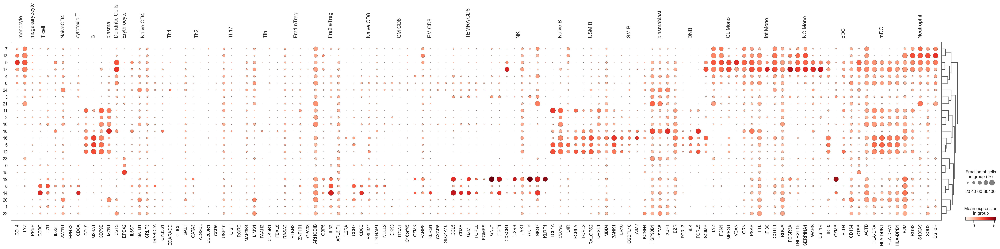

In [296]:
sc.pl.dotplot(adata_concat, marker_genes_dict, groupby='louvain', dendrogram=True);

In [301]:
pd.crosstab(adata_concat.obs.celltype_origin, adata_concat.obs.louvain)

louvain,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
celltype_origin,,,,,,,,,,,,,,,,,,,,,,,,,
,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
BNK,1,74,75,1,0,0,3,0,0,0,75,0,0,0,0,3,0,0,0,0,2,0,0,0,0
CD4T,0,1,0,0,0,0,0,0,181,0,0,0,0,0,64,0,0,0,0,0,0,0,0,0,0
CD8T,0,0,0,0,0,0,0,0,115,0,0,0,0,0,156,0,0,0,0,0,0,0,0,0,0
CLP,0,3,50,0,5,0,2,0,0,1,87,1,0,0,0,0,0,0,0,0,0,0,0,0,0
CMP,2,55,0,0,8,0,35,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,0,11
GMP,1,68,0,2,32,0,2,0,0,0,9,0,0,0,0,2,0,0,0,0,2,0,2,0,0
HSC,0,85,0,1,13,0,129,2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
LMPP,0,58,0,2,55,0,25,0,0,0,1,0,0,0,0,2,0,0,0,0,20,0,1,0,0


__differences and similarities__

* GSE149938 dataset include more expressed genes than Frozen PBMCs dataset: The genes unique to GSE149938 were 7111, while those unique to Frozen PBMCs were 1679.
* Most Frozen PBMCs are a group of cells corresponding to Erythrocyte, CD4T, B, DC, Monocyte, and NK in GSE149938, whereas neutrophils and plasma are very few.
